In [28]:
# Core libraries

import os
import warnings
import random
import timeit
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import cv2 as cv
from PIL import Image

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import (
    Input, Dense, Flatten, Dropout, Activation,
    Conv2D, MaxPooling2D, AveragePooling2D,
    GlobalAveragePooling2D, BatchNormalization
)
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.applications.xception import Xception

from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.callbacks import (
    ModelCheckpoint, EarlyStopping,
    ReduceLROnPlateau, CSVLogger
)
from tqdm import tqdm

%matplotlib inline
import matplotlib.image as mpimg

In [29]:
pip install graphviz


Note: you may need to restart the kernel to use updated packages.


In [30]:
warnings.filterwarnings('ignore')


In [32]:
# Define path to data
annotations_dir = '../Seminar_Project/annotations/Annotation' 
images_dir = '../Seminar_Project/images/Images'

In [33]:
# Count the number of classes (dogs breeds)
breed_list = os.listdir(images_dir)
print("Number of breeds in dataset:", (len(breed_list)))

Number of breeds in dataset: 120


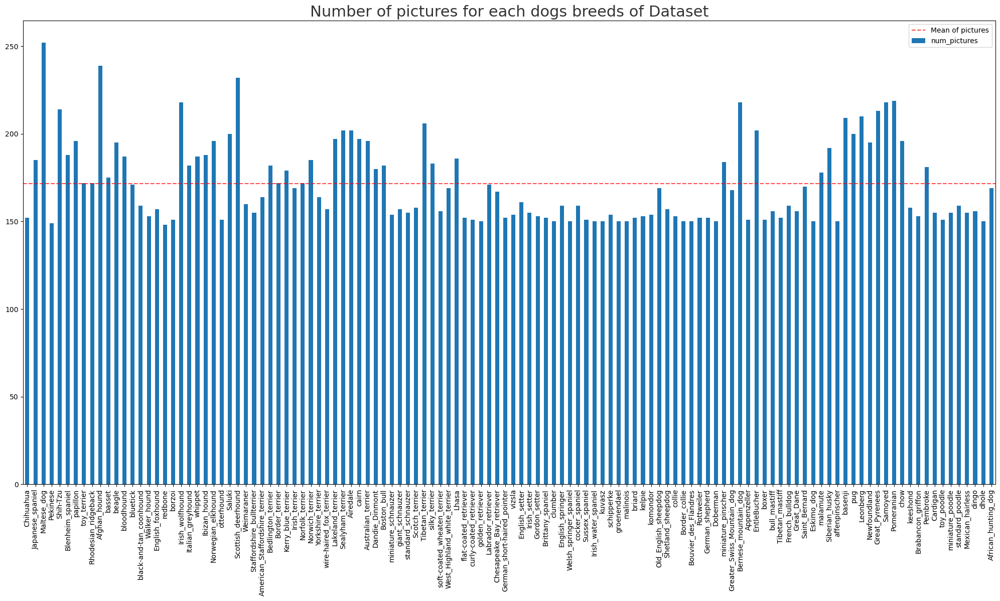

In [34]:
# Count number of pictures for each breed
df_breeds = pd.DataFrame(
    index=[breed.split('-',1)[1]
           for breed in breed_list],
    data=[len(os.listdir(images_dir + "/" + name))
          for name in breed_list],
    columns=["num_pictures"])

# Plot results
fig, ax = plt.subplots(1, 1, figsize=(25,12))
df_breeds.plot(kind="bar",
               legend=False,
               ax=ax)
ax.axhline(df_breeds["num_pictures"].mean(),
           color='r', alpha=.7,
           linestyle='--',
           label="Mean of pictures")
plt.title("Number of pictures for each "\
          "dogs breeds of Dataset",
          color="#343434", fontsize=22)
plt.legend()
plt.show()

In [35]:
def show_images_classes(path, classes, num_sample):
    fig = plt.figure(figsize=(20,20))
    fig.patch.set_facecolor('#343434')
    plt.suptitle("{}".format(classes.split("-")[1]), y=.83,
                 color="white", fontsize=22)
    images = os.listdir(path + "/" + classes)[:num_sample]
    for i in range(num_sample):
        img = mpimg.imread(path+"/"+classes+"/"+images[i])
        plt.subplot(int(num_sample/5)+1, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

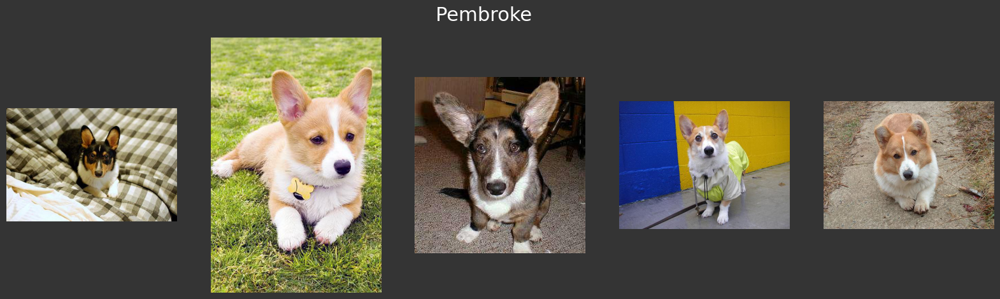

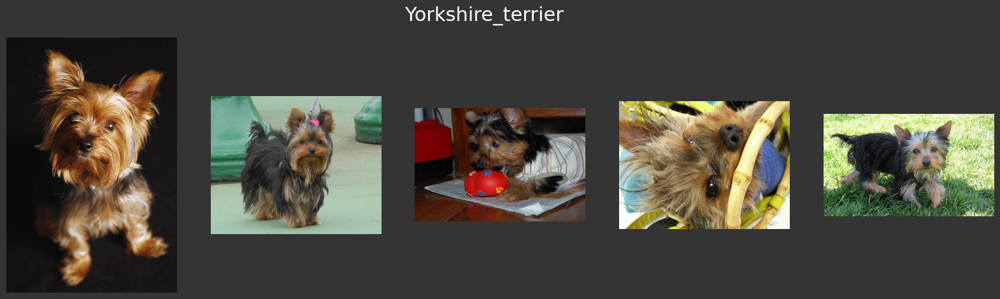

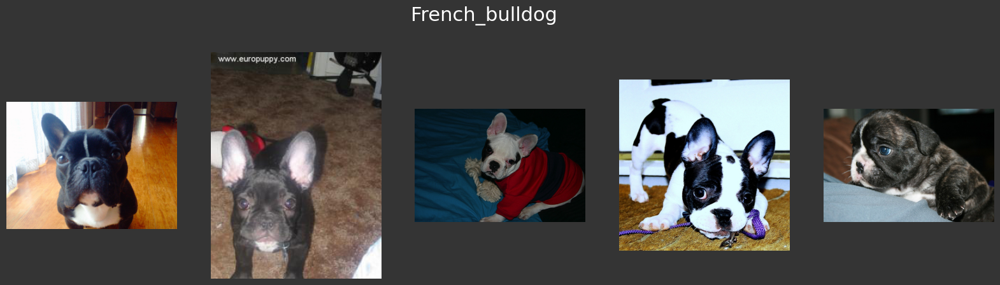

In [36]:
for i in np.random.randint(0, len(breed_list), size=3):
    show_images_classes(images_dir, breed_list[i], 5)

In [37]:
# Define test image
img_test = (images_dir 
            + "/" 
            + "n02108915-French_bulldog/n02108915_7806.jpg")
img_test = cv.imread(img_test)

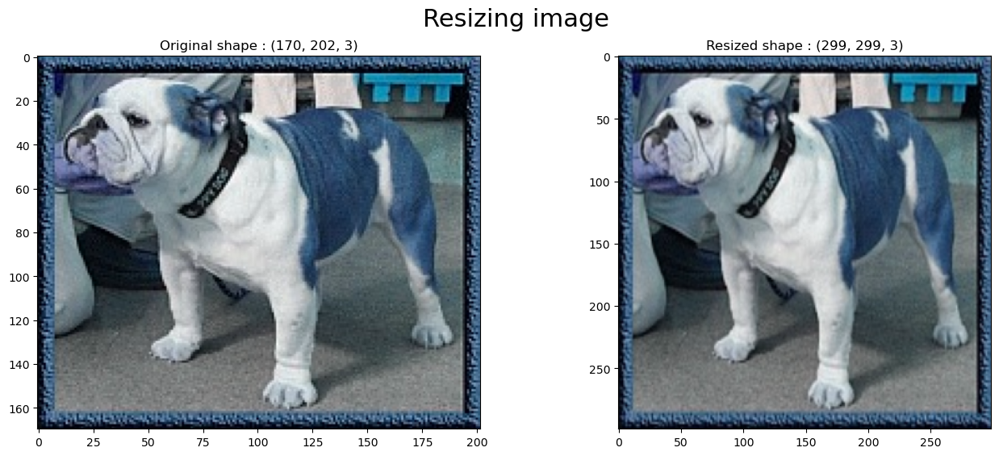

In [38]:
# setting dim of the resize
height = 299
width = 299
dim = (width, height)
# resize image with OpenCV
res_img = cv.resize(img_test, dim, interpolation=cv.INTER_LINEAR)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_test)
plt.title("Original shape : {}".format(img_test.shape))
plt.subplot(1, 2, 2)
plt.imshow(res_img)
plt.title("Resized shape : {}".format(res_img.shape))
plt.suptitle("Resizing image",
             color="black", 
             fontsize=22, y=.98)
plt.show()

In [39]:
# Transform image with differents color sets
img_RGB = cv.cvtColor(img_test, cv.COLOR_BGR2RGB)
img_grayscale = cv.cvtColor(img_test, cv.COLOR_RGB2GRAY)
img_YUV = cv.cvtColor(img_test,cv.COLOR_BGR2YUV)

In [40]:
# Create histogram
def plot_histogram(init_img, convert_img):
    """Function allowing to display the initial
    and converted images according to a certain
    colorimetric format as well as the histogram
    of the latter. 

    Parameters
    -------------------------------------------
    init_img : list
        init_img[0] = Title of the init image
        init_img[1] = Init openCV image
    convert_img : list
        convert_img[0] = Title of the converted
        convert_img[1] = converted openCV image
    -------------------------------------------
    """
    hist, bins = np.histogram(
                    convert_img[1].flatten(),
                    256, [0,256])
    # Cumulative Distribution Function
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()

    # Plot histogram
    fig = plt.figure(figsize=(25,6))
    plt.subplot(1, 3, 1)
    plt.imshow(init_img[1])
    plt.title("{} Image".format(init_img[0]), 
              color="#343434")
    plt.subplot(1, 3, 2)
    plt.imshow(convert_img[1])
    plt.title("{} Image".format(convert_img[0]), 
              color="#343434")
    plt.subplot(1, 3, 3)
    plt.plot(cdf_normalized, 
             color='r', alpha=.7,
             linestyle='--')
    plt.hist(convert_img[1].flatten(),256,[0,256])
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.title("Histogram of convert image", color="#343434")
    plt.suptitle("Histogram and cumulative "\
                 "distribution for test image",
              color="black", fontsize=22, y=.98)
    plt.show()

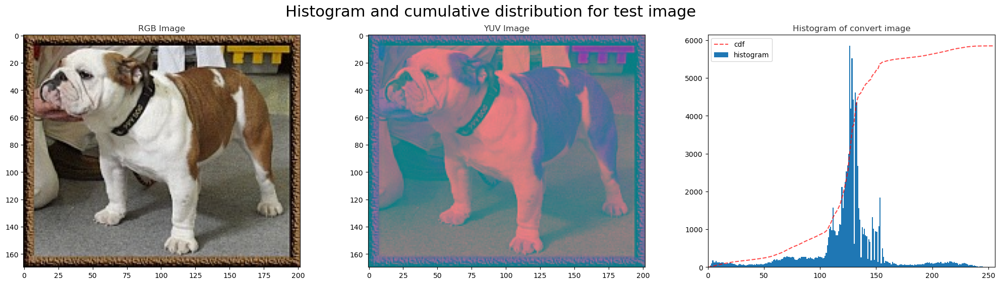

In [41]:
plot_histogram(["RGB", img_RGB], ["YUV", img_YUV])


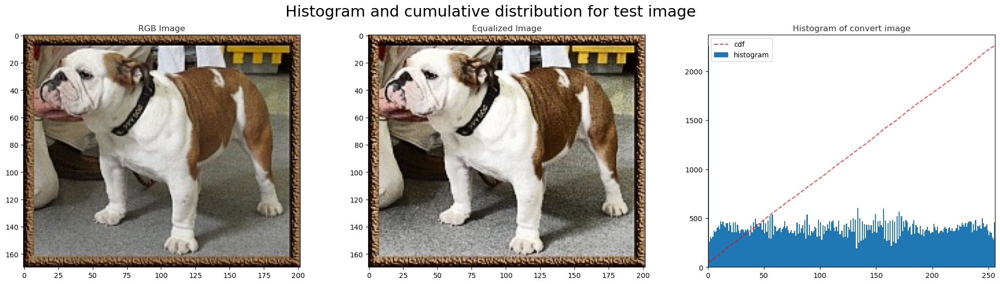

In [42]:
# Equalization
img_YUV[:,:,0] = cv.equalizeHist(img_YUV[:,:,0])
img_equ = cv.cvtColor(img_YUV, cv.COLOR_YUV2RGB)
plot_histogram(["RGB", img_RGB], ["Equalized", img_equ])

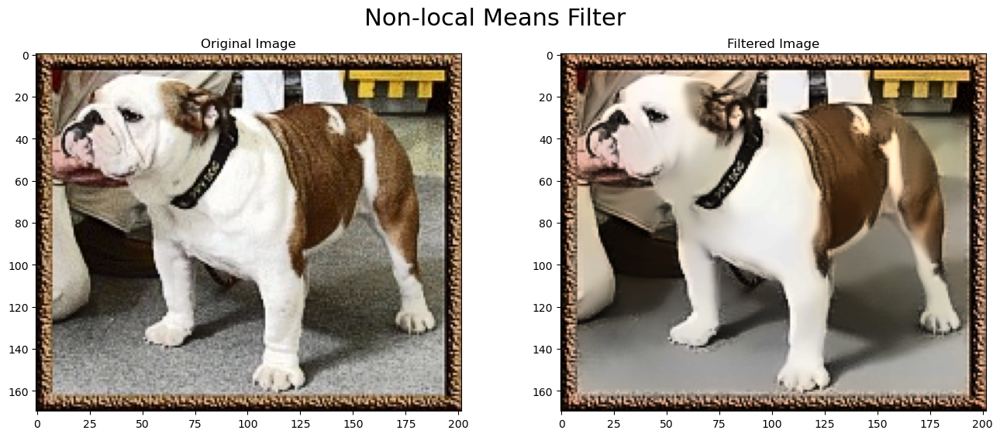

In [43]:
# Apply non-local means filter on test img
dst_img = cv.fastNlMeansDenoisingColored(
    src=img_equ,
    dst=None,
    h=10,
    hColor=10,
    templateWindowSize=7,
    searchWindowSize=21)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_equ)
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(dst_img)
plt.title("Filtered Image")
plt.suptitle("Non-local Means Filter",
             color="black", 
             fontsize=22, y=.98)
plt.show()

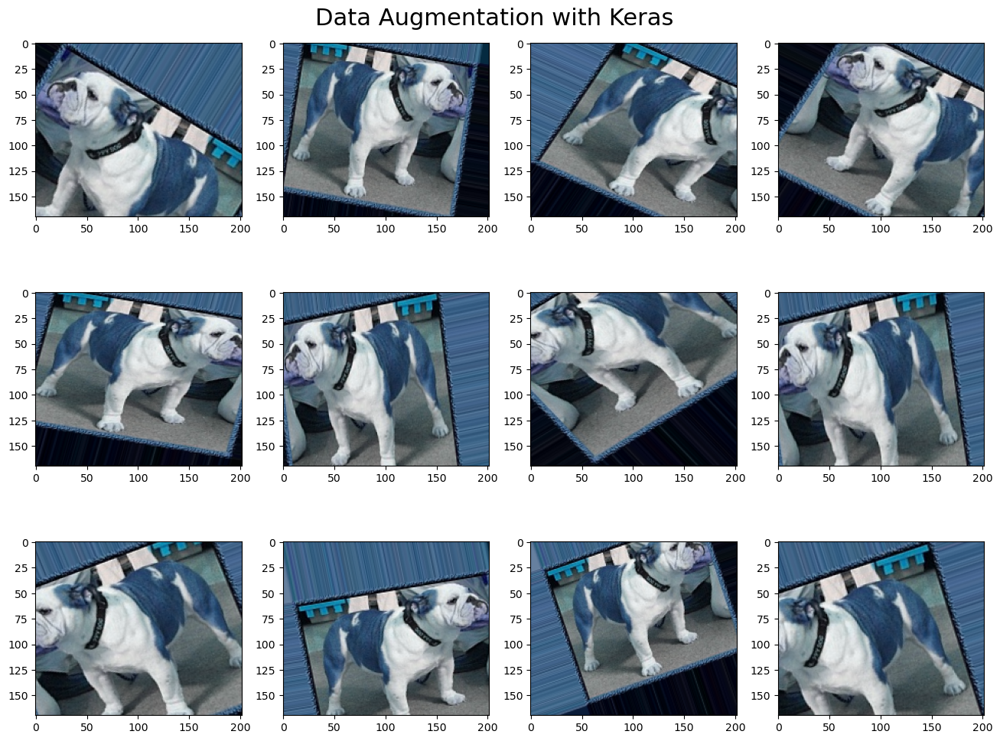

In [44]:
#Initilize Data Generator Keras
augmented_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

# Convert test img to array
x = image.img_to_array(img_test)
x = x.reshape((1,) + x.shape)

i=0
fig = plt.figure(figsize=(16,12))
for batch in augmented_datagen.flow(x, batch_size=1):
    ax = fig.add_subplot(3,4,i+1)
    ax.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 12 == 0:
        break

plt.suptitle("Data Augmentation with Keras",
             color="black", 
             fontsize=22, y=.90)
plt.show()

In [45]:
def preprocessing_cnn(directories, img_width, img_height):
    img_list=[]
    labels=[]
    for index, breed in enumerate(directories):
        for image_name in os.listdir(images_dir+"/"+breed):
            # Read image
            img = cv.imread(images_dir+"/"+breed+"/"+image_name)
            img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
            # Resize image
            dim = (img_width, img_height)
            img = cv.resize(img, dim, interpolation=cv.INTER_LINEAR)
            # Equalization
            img_yuv = cv.cvtColor(img,cv.COLOR_BGR2YUV)
            img_yuv[:,:,0] = cv.equalizeHist(img_yuv[:,:,0])
            img_equ = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)
            # Apply non-local means filter on test img
            dst_img = cv.fastNlMeansDenoisingColored(
                src=img_equ,
                dst=None,
                h=10,
                hColor=10,
                templateWindowSize=7,
                searchWindowSize=21)
            
            # Convert modified img to array
            img_array = image.img_to_array(dst_img)
            
            # Append lists of labels and images
            img_list.append(np.array(img_array))
            labels.append(breed.split("-")[1])
    
    return img_list, labels

In [46]:
import os

all_breed_list = [
    d for d in os.listdir(images_dir)
    if os.path.isdir(os.path.join(images_dir, d))
]


In [48]:
# Define numbers of breeds to preprocess
num_breeds = len(all_breed_list) 

# Execute preprocessor on selection
start_time = timeit.default_timer()
# X = images
# y = labels
X, y = preprocessing_cnn(all_breed_list, 299, 299)
# Convert in numpy array
X = np.array(X)
y = np.array(y)
preprocess_time = timeit.default_timer() - start_time
print("-" * 50)
print("Execution time for preprocessing :")
print("-" * 50)
print("Number of images preprocessed : {}"\
     .format(len(y)))
print("Shape of images np.array : {}"\
     .format(X.shape))
print("Total time : {:.2f}s".format(preprocess_time))

--------------------------------------------------
Execution time for preprocessing :
--------------------------------------------------
Number of images preprocessed : 20580
Shape of images np.array : (20580, 299, 299, 3)
Total time : 13382.72s


## Please note the 4 Hours training time in case of reduplication of results

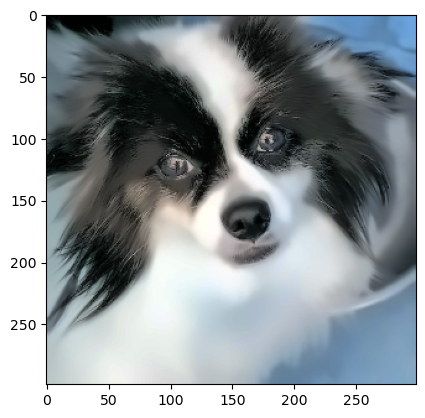

In [49]:
# Show exemple preprocessed image
plt.imshow(image.array_to_img(X[1234]))

In [52]:
# Using np.shuffle
img_space = np.arange(X.shape[0])
np.random.seed(8)
# Shuffle the space
np.random.shuffle(img_space)
# Apply to X and y in same order
X = X[img_space]
y = y[img_space]

In [53]:
# Change X type 
X = X.astype(np.float32)
# Encode y text data in numeric
encoder = LabelEncoder()
encoder.fit(y)
y = encoder.transform(y)


In [54]:
# Using np.shuffle
img_space = np.arange(X.shape[0])
np.random.seed(8)
# Shuffle the space
np.random.shuffle(img_space)
# Apply to X and y in same order
X = X[img_space]
y = y[img_space]

In [55]:
# Change X type 
X = X.astype(np.float32)
# Encode y text data in numeric
encoder = LabelEncoder()
encoder.fit(y)
y = encoder.transform(y)

In [ ]:
### Create train and test set
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print("-" * 50)
print("Size of created sets :")
print("-" * 50)
print("Train set size = ",x_train.shape[0])
print("Test set size = ",x_test.shape[0])

In [58]:
# Data generator on train set with Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(rescale=1./255)

# CNN

In [59]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [60]:
K.clear_session()
model = Sequential()
# Convolution layer
model.add(Conv2D(filters=16,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
# Pooling layer
model.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Second convolution layer
model.add(Conv2D(filters=32,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# Third convolution layer
model.add(Conv2D(filters=64,
                 kernel_size=(3,3), 
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(GlobalAveragePooling2D())
# Fully connected layers
model.add(Dense(128, activation='relu'))
model.add(Dense(num_breeds, activation='softmax'))



You must install graphviz (see instructions at https://graphviz.gitlab.io/download/) for `plot_model` to work.


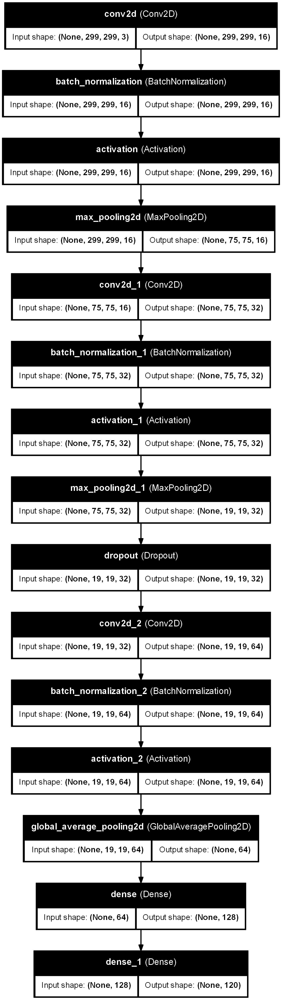

In [97]:
plot_model(model, to_file='CNN_model_plot.png', 
           show_shapes=True, show_layer_names=True)

In [62]:
# Compile the CNN Model
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy"])

In [147]:
# -----------------------------
# Imports
# -----------------------------
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import (Conv2D, BatchNormalization, Activation,
                                     MaxPooling2D, Dropout, GlobalAveragePooling2D, Dense)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import plot_model


def recall_m(y_true, y_pred):
    y_pred_labels = tf.argmax(y_pred, axis=1)
    y_true = tf.cast(y_true, tf.int64)
    true_positives = tf.reduce_sum(tf.cast(tf.equal(y_true, y_pred_labels), tf.float32))
    possible_positives = tf.cast(tf.size(y_true), tf.float32)
    return true_positives / (possible_positives + K.epsilon())

def precision_m(y_true, y_pred):
    return recall_m(y_true, y_pred)

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))


K.clear_session()

# Build CNN Model

num_breeds = 120 

model = Sequential()

# First Convolution Block
model.add(Conv2D(16, kernel_size=(3,3), padding='same', use_bias=False, input_shape=(299,299,3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(4,4), strides=(4,4), padding='same'))

# Second Convolution Block
model.add(Conv2D(32, kernel_size=(3,3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(4,4), strides=(4,4), padding='same'))
model.add(Dropout(0.2))

# Third Convolution Block
model.add(Conv2D(64, kernel_size=(3,3), padding='same', use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(GlobalAveragePooling2D())

# Fully Connected Layers
model.add(Dense(128, activation='relu'))
model.add(Dense(num_breeds, activation='softmax'))

# Visualize Model
plot_model(model, to_file='CNN_model_plot.png', show_shapes=True, show_layer_names=True)


# Compile Model

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',  # integer labels
    metrics=['accuracy', f1_m]
)

# Data Generators

train_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2  # 20% for validation
)

batch_size = 32

train_generator = train_datagen.flow(
    x_train, y_train,
    batch_size=batch_size,
    subset='training',
    shuffle=True
)

val_generator = train_datagen.flow(
    x_train, y_train,
    batch_size=batch_size,
    subset='validation'
)

steps_per_epoch = len(train_generator)
validation_steps = len(val_generator)

# Train Model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    steps_per_epoch=steps_per_epoch,
    validation_steps=validation_steps,
    epochs=20,
    verbose=2
)


Epoch 1/20
51/51 - 56s - 1s/step - accuracy: 0.0725 - f1_m: 0.0733 - loss: 3.5606 - val_accuracy: 0.0347 - val_f1_m: 0.0353 - val_loss: 3.1535
Epoch 2/20
51/51 - 41s - 796ms/step - accuracy: 0.1146 - f1_m: 0.1141 - loss: 2.6614 - val_accuracy: 0.0397 - val_f1_m: 0.0385 - val_loss: 2.8134
Epoch 3/20
51/51 - 41s - 813ms/step - accuracy: 0.1245 - f1_m: 0.1247 - loss: 2.6213 - val_accuracy: 0.0769 - val_f1_m: 0.0762 - val_loss: 2.8247
Epoch 4/20
51/51 - 37s - 722ms/step - accuracy: 0.1338 - f1_m: 0.1331 - loss: 2.5826 - val_accuracy: 0.0521 - val_f1_m: 0.0521 - val_loss: 2.7610
Epoch 5/20
51/51 - 35s - 677ms/step - accuracy: 0.1468 - f1_m: 0.1460 - loss: 2.5527 - val_accuracy: 0.0968 - val_f1_m: 0.0970 - val_loss: 2.7527
Epoch 6/20
51/51 - 39s - 759ms/step - accuracy: 0.1741 - f1_m: 0.1745 - loss: 2.5235 - val_accuracy: 0.0968 - val_f1_m: 0.0954 - val_loss: 2.8137
Epoch 7/20
51/51 - 24s - 465ms/step - accuracy: 0.1660 - f1_m: 0.1674 - loss: 2.5152 - val_accuracy: 0.0769 - val_f1_m: 0.0778 

In [148]:
def plot_history_scores(dict_history, first_score, second_score):
    with plt.style.context('seaborn-v0_8-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()

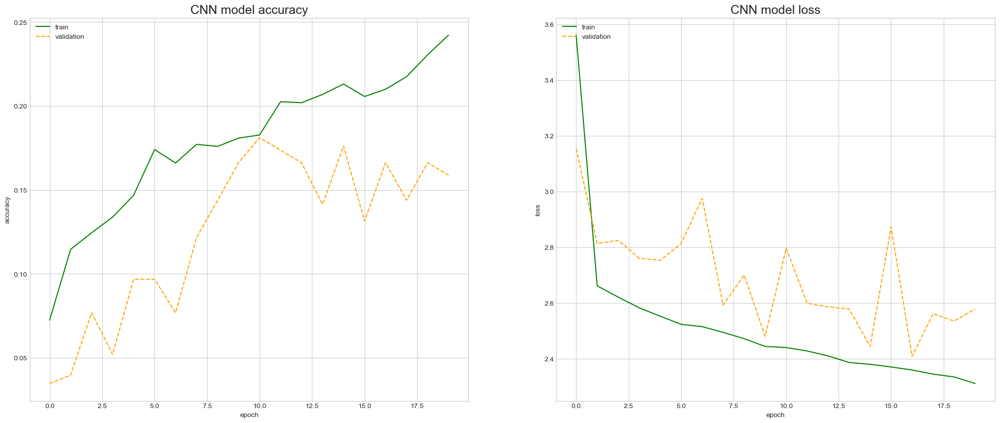

In [149]:
plot_history_scores(
    dict_history = history, 
    first_score = "accuracy", 
    second_score = "loss")

## Transfert Learning : Modèle CNN pré-entrainé Xception

In [66]:
K.clear_session()
# Import Xception trained model
xception_model = tf.keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False, 
    pooling='avg',
    input_shape=(299,299,3))

# look at the differents layers
print("-" * 50)
print("Xception base model layers :")
print("-" * 50)
for layer in xception_model.layers:
    print(layer)

--------------------------------------------------
Xception base model layers :
--------------------------------------------------
<InputLayer name=input_layer, built=True>
<Conv2D name=block1_conv1, built=True>
<BatchNormalization name=block1_conv1_bn, built=True>
<Activation name=block1_conv1_act, built=True>
<Conv2D name=block1_conv2, built=True>
<BatchNormalization name=block1_conv2_bn, built=True>
<Activation name=block1_conv2_act, built=True>
<SeparableConv2D name=block2_sepconv1, built=True>
<BatchNormalization name=block2_sepconv1_bn, built=True>
<Activation name=block2_sepconv2_act, built=True>
<SeparableConv2D name=block2_sepconv2, built=True>
<BatchNormalization name=block2_sepconv2_bn, built=True>
<Conv2D name=conv2d, built=True>
<MaxPooling2D name=block2_pool, built=True>
<BatchNormalization name=batch_normalization, built=True>
<Add name=add, built=True>
<Activation name=block3_sepconv1_act, built=True>
<SeparableConv2D name=block3_sepconv1, built=True>
<BatchNormalizatio

In [67]:
for layer in xception_model.layers:
    layer.trainable = False

In [68]:
# Add new fully-connected layers
base_output = xception_model.output
base_output = Dense(128, activation='relu')(base_output)
base_output = Dropout(0.2)(base_output)
# Output : new classifier
predictions = Dense(num_breeds, activation='softmax')(base_output)

# Define new model
my_xcept_model = Model(inputs=xception_model.input,
                       outputs=predictions)
my_xcept_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

In [96]:
Xception_plot = plot_model(my_xcept_model,
                           to_file='xcept_model_plot.png',
                           show_shapes=True,
                           show_layer_names=False)
Xception_plot

In [70]:
# Data generator on train set with Data Augmentation
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

In [71]:
history_xcept = my_xcept_model.fit(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_train) // 32,
    epochs=20,
    verbose=2)

Epoch 1/20
63/63 - 200s - 3s/step - accuracy: 0.4076 - f1_m: 0.4067 - loss: 2.2685 - val_accuracy: 0.7072 - val_f1_m: 0.7163 - val_loss: 1.0809
Epoch 2/20
63/63 - 132s - 2s/step - accuracy: 0.6595 - f1_m: 0.6595 - loss: 1.1549 - val_accuracy: 0.7097 - val_f1_m: 0.6979 - val_loss: 0.9483
Epoch 3/20
63/63 - 204s - 3s/step - accuracy: 0.7097 - f1_m: 0.7099 - loss: 0.9148 - val_accuracy: 0.7146 - val_f1_m: 0.7236 - val_loss: 0.8662
Epoch 4/20
63/63 - 167s - 3s/step - accuracy: 0.7648 - f1_m: 0.7648 - loss: 0.8011 - val_accuracy: 0.7469 - val_f1_m: 0.7340 - val_loss: 0.7768
Epoch 5/20
63/63 - 231s - 4s/step - accuracy: 0.7589 - f1_m: 0.7589 - loss: 0.7587 - val_accuracy: 0.7494 - val_f1_m: 0.7364 - val_loss: 0.7736
Epoch 6/20
63/63 - 164s - 3s/step - accuracy: 0.7624 - f1_m: 0.7625 - loss: 0.7032 - val_accuracy: 0.7667 - val_f1_m: 0.7740 - val_loss: 0.7480
Epoch 7/20
63/63 - 231s - 4s/step - accuracy: 0.7913 - f1_m: 0.7912 - loss: 0.6439 - val_accuracy: 0.7221 - val_f1_m: 0.7204 - val_loss:

In [157]:
def plot_history_scores(dict_history, first_score, second_score):
    with plt.style.context('seaborn-v0_8-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        # summarize history for accuracy
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('Xception model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        # summarize history for loss
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('Xception model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()

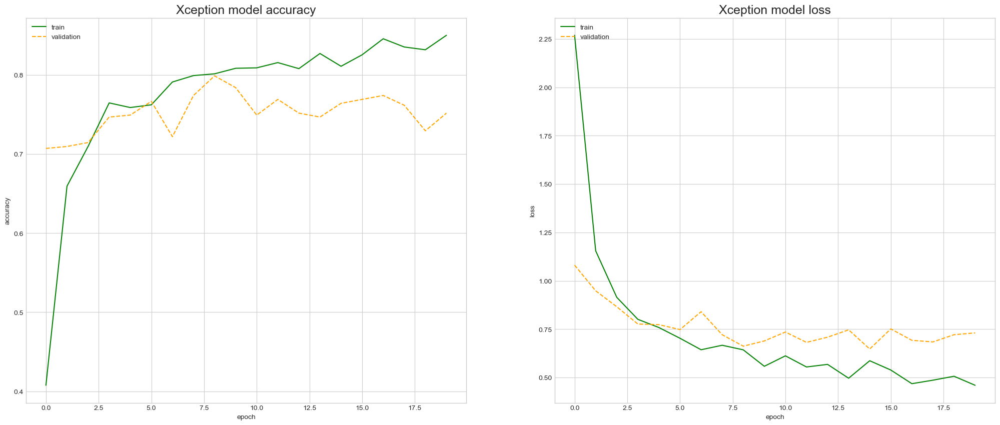

In [158]:
plot_history_scores(
    dict_history = history_xcept, 
    first_score = "accuracy", 
    second_score = "loss")

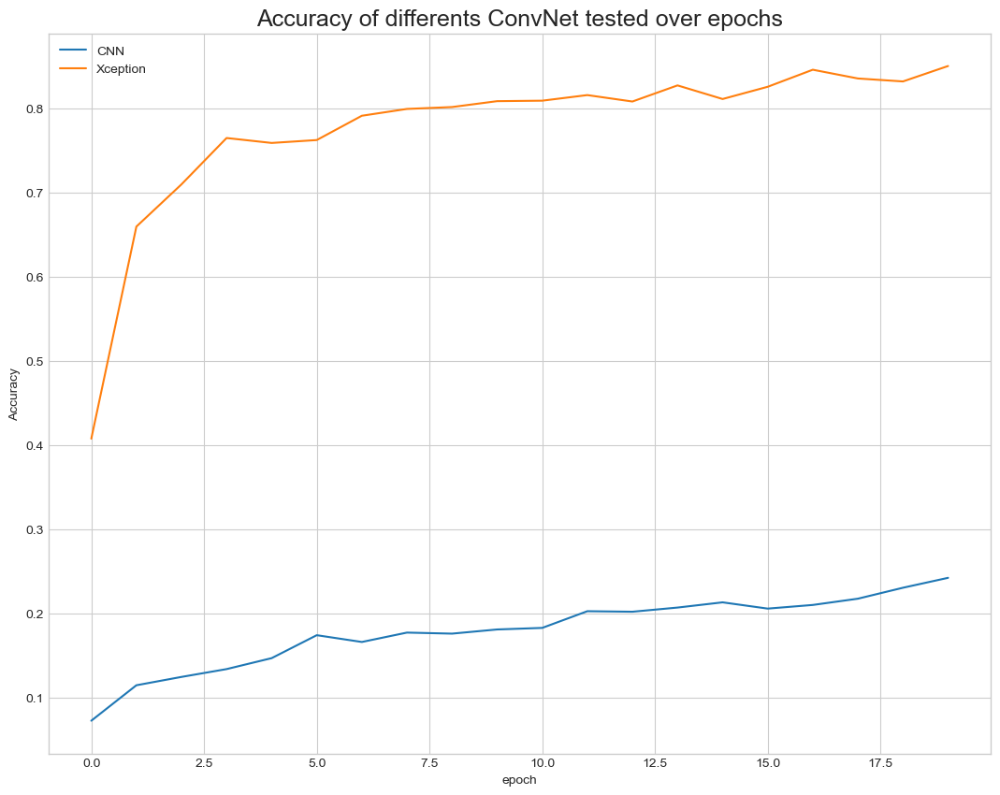

In [153]:
with plt.style.context('seaborn-v0_8-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN')
    plt.plot(history_xcept.history['accuracy'],
             label='Xception')
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

In [74]:
xcept_mean_accuracy = np.mean(history_xcept.history['val_accuracy'])
xcept_mean_f1 = np.mean(history_xcept.history['val_f1_m'])
print("-" * 50)
print("Xception base model validation Scores :")
print("-" * 50)
print("Mean validation accuracy: {:.2f}"\
      .format(xcept_mean_accuracy))
print("Mean validation F1 score: {:.2f}"\
      .format(xcept_mean_f1))

--------------------------------------------------
Xception base model validation Scores :
--------------------------------------------------
Mean validation accuracy: 0.75
Mean validation F1 score: 0.75


In [75]:
 K.clear_session()
# Import ResNet50 trained model
resnet_model = tf.keras.applications.ResNet50(
    weights='imagenet',
    include_top=False, 
    pooling='avg',
    input_shape=(299,299,3))

# Dont retrain layers
for rn_layer in resnet_model.layers:
    rn_layer.trainable = False
    
# Add new fully-connected layers
rn_base_output = resnet_model.output
rn_base_output = Dense(128, activation='relu')(rn_base_output)
rn_base_output = Dropout(0.2)(rn_base_output)
# Output : new classifier
rn_predictions = Dense(num_breeds, activation='softmax')(rn_base_output)

# Define new model
my_resnet_model = Model(inputs=resnet_model.input,
                        outputs=rn_predictions)
my_resnet_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

# Data generator on train set with Data Augmentation
# and preprocess_input Resnet
# Validation set is define here
rn_train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.resnet.preprocess_input)

#For validation and test, just rescale
rn_test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.resnet.preprocess_input)

In [98]:
plot_model(my_resnet_model, to_file='ResNet50_model_plot.png', 
           show_shapes=True, show_layer_names=True)

In [76]:
history_resnet = my_resnet_model.fit(
    rn_train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=rn_train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_train) // 32,
    epochs=20,
    verbose=2)

Epoch 1/20
63/63 - 250s - 4s/step - accuracy: 0.1750 - f1_m: 0.1746 - loss: 2.7843 - val_accuracy: 0.3797 - val_f1_m: 0.3782 - val_loss: 1.8769
Epoch 2/20
63/63 - 164s - 3s/step - accuracy: 0.4457 - f1_m: 0.4457 - loss: 1.7116 - val_accuracy: 0.4864 - val_f1_m: 0.4920 - val_loss: 1.5022
Epoch 3/20
63/63 - 223s - 4s/step - accuracy: 0.5208 - f1_m: 0.5208 - loss: 1.4775 - val_accuracy: 0.5658 - val_f1_m: 0.5689 - val_loss: 1.2741
Epoch 4/20
63/63 - 162s - 3s/step - accuracy: 0.5693 - f1_m: 0.5695 - loss: 1.3424 - val_accuracy: 0.6203 - val_f1_m: 0.6218 - val_loss: 1.2106
Epoch 5/20
63/63 - 242s - 4s/step - accuracy: 0.6342 - f1_m: 0.6344 - loss: 1.1214 - val_accuracy: 0.6625 - val_f1_m: 0.6627 - val_loss: 1.0287
Epoch 6/20
63/63 - 126s - 2s/step - accuracy: 0.6316 - f1_m: 0.6316 - loss: 1.0460 - val_accuracy: 0.6476 - val_f1_m: 0.6482 - val_loss: 1.0686
Epoch 7/20
63/63 - 206s - 3s/step - accuracy: 0.6419 - f1_m: 0.6419 - loss: 1.0689 - val_accuracy: 0.6725 - val_f1_m: 0.6827 - val_loss:

In [107]:
def plot_history_scores(dict_history, first_score, second_score):
    with plt.style.context('seaborn-v0_8-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        # summarize history for accuracy
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('ResNet50 model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        # summarize history for loss
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('ResNet50 model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()

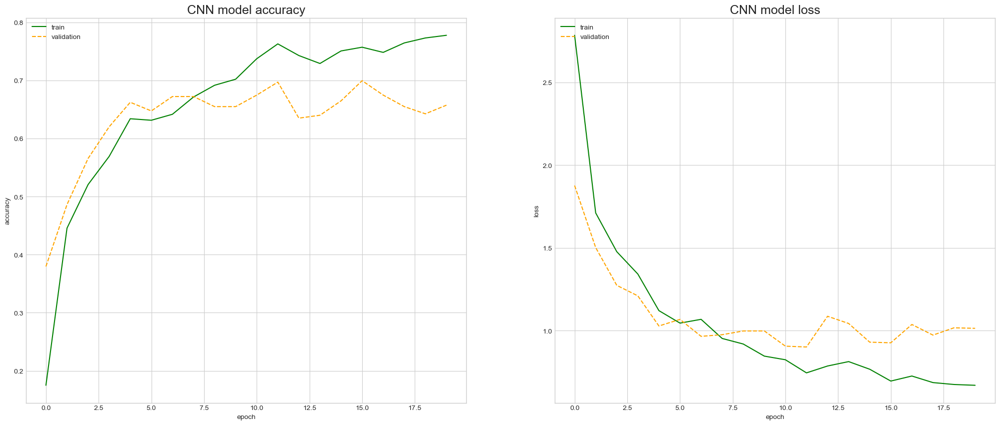

In [152]:
plot_history_scores(
    dict_history = history_resnet, 
    first_score = "accuracy", 
    second_score = "loss")

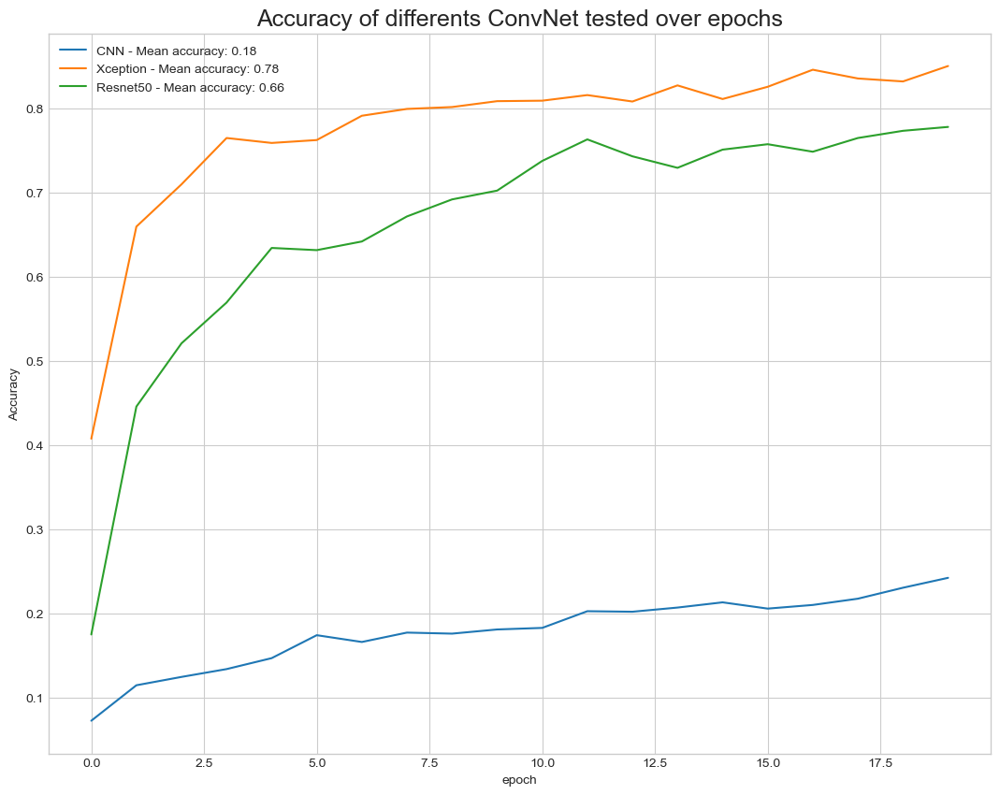

In [154]:
with plt.style.context('seaborn-v0_8-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN - Mean accuracy: {:.2f}'.format(
                 np.mean(history.history['accuracy'])))
    plt.plot(history_xcept.history['accuracy'],
             label='Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(history_xcept.history['accuracy'])))
    plt.plot(history_resnet.history['accuracy'],
             label='Resnet50 - Mean accuracy: {:.2f}'.format(
                 np.mean(history_resnet.history['accuracy'])))
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

In [79]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Clear session
K.clear_session()
x_train_eff = tf.image.resize(x_train, (300, 300))

# EfficientNetB3 backbone
effnet_model = tf.keras.applications.EfficientNetB3(
    weights='imagenet',
    include_top=False,
    pooling='avg',
    input_shape=(300, 300, 3)
)

# Freeze backbone
for layer in effnet_model.layers:
    layer.trainable = False

# Custom classifier head
eff_base_output = effnet_model.output
eff_base_output = Dense(128, activation='relu')(eff_base_output)
eff_base_output = Dropout(0.2)(eff_base_output)
eff_predictions = Dense(num_breeds, activation='softmax')(eff_base_output)


In [80]:
# Final model
my_effnet_model = Model(
    inputs=effnet_model.input,
    outputs=eff_predictions
)

my_effnet_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)



In [81]:
# Data generators
eff_train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
)

eff_test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
)

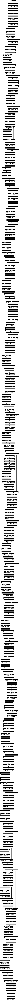

In [101]:
plot_model(my_effnet_model, to_file='EffNet_model_plot.png', 
           show_shapes=True, show_layer_names=True)

In [82]:
history_effnet = my_effnet_model.fit(
    eff_train_datagen.flow(
        x_train_eff, y_train,
        batch_size=16,
        subset='training'
    ),
    validation_data=eff_train_datagen.flow(
        x_train_eff, y_train,
        batch_size=16,
        subset='validation'
    ),
    steps_per_epoch=len(x_train_eff) // 32,
    epochs=20,
    verbose=2
)



Epoch 1/20
63/63 - 216s - 3s/step - accuracy: 0.4891 - f1_m: 0.4892 - loss: 2.0412 - val_accuracy: 0.7171 - val_f1_m: 0.7260 - val_loss: 0.8831
Epoch 2/20
63/63 - 117s - 2s/step - accuracy: 0.7056 - f1_m: 0.7056 - loss: 0.9321 - val_accuracy: 0.7717 - val_f1_m: 0.7788 - val_loss: 0.7038
Epoch 3/20
63/63 - 170s - 3s/step - accuracy: 0.7604 - f1_m: 0.7602 - loss: 0.7498 - val_accuracy: 0.7792 - val_f1_m: 0.7652 - val_loss: 0.7043
Epoch 4/20
63/63 - 121s - 2s/step - accuracy: 0.7648 - f1_m: 0.7648 - loss: 0.7475 - val_accuracy: 0.7643 - val_f1_m: 0.7404 - val_loss: 0.6785
Epoch 5/20
63/63 - 166s - 3s/step - accuracy: 0.7684 - f1_m: 0.7683 - loss: 0.7144 - val_accuracy: 0.7742 - val_f1_m: 0.7708 - val_loss: 0.6337
Epoch 6/20
63/63 - 123s - 2s/step - accuracy: 0.8092 - f1_m: 0.8092 - loss: 0.6100 - val_accuracy: 0.7866 - val_f1_m: 0.7933 - val_loss: 0.6167
Epoch 7/20
63/63 - 154s - 2s/step - accuracy: 0.8165 - f1_m: 0.8165 - loss: 0.5725 - val_accuracy: 0.7916 - val_f1_m: 0.7981 - val_loss:

In [ ]:
def plot_history_scores(dict_history, first_score, second_score):
    with plt.style.context('seaborn-v0_8-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        # summarize history for accuracy
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('EffNet model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        # summarize history for loss
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('EffNet model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()

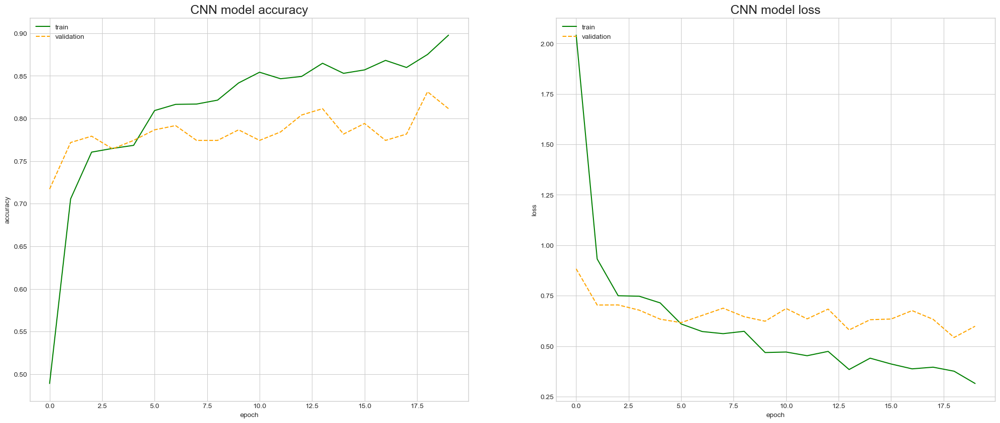

In [155]:
plot_history_scores(
    dict_history = history_effnet, 
    first_score = "accuracy", 
    second_score = "loss")

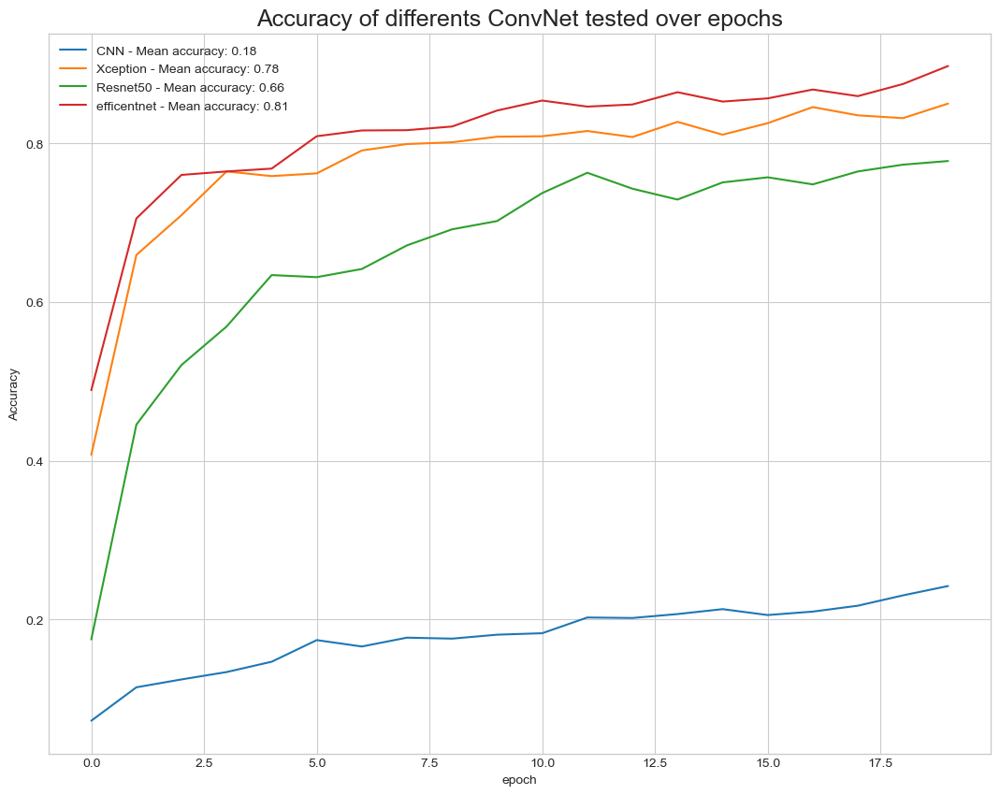

In [156]:
with plt.style.context('seaborn-v0_8-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN - Mean accuracy: {:.2f}'.format(
                 np.mean(history.history['accuracy'])))
    plt.plot(history_xcept.history['accuracy'],
             label='Xception - Mean accuracy: {:.2f}'.format(
                 np.mean(history_xcept.history['accuracy'])))
    plt.plot(history_resnet.history['accuracy'],
             label='Resnet50 - Mean accuracy: {:.2f}'.format(
                 np.mean(history_resnet.history['accuracy'])))
    plt.plot(history_effnet.history['accuracy'],
             label='efficentnet - Mean accuracy: {:.2f}'.format(
                 np.mean(history_effnet.history['accuracy'])))
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

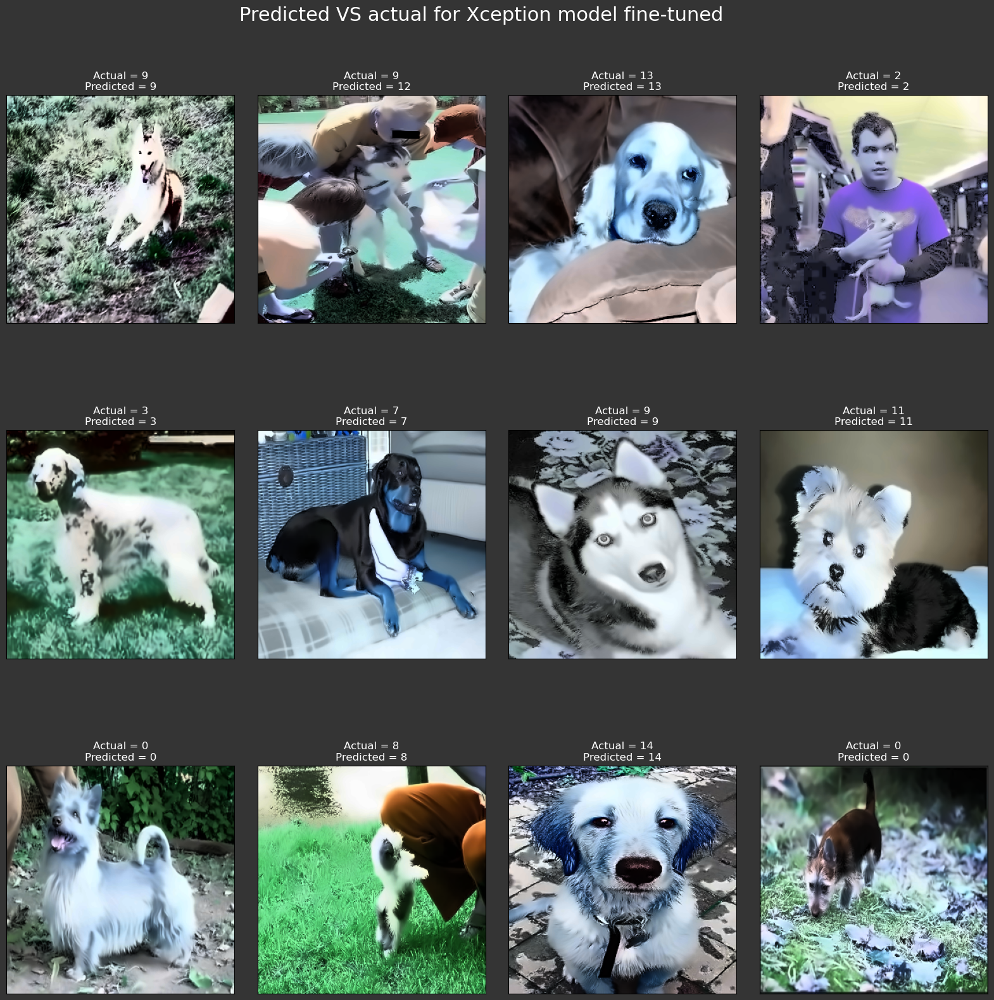

In [86]:
fig = plt.figure(1, figsize=(20,20))
fig.patch.set_facecolor('#343434')
plt.suptitle("Predicted VS actual for Xception model fine-tuned",
             y=.92, fontsize=22,
             color="white")

n = 0

for i in range(12):
    n+=1
    r = int(np.random.randint(0, x_test.shape[0], 1))
    plt.subplot(3,4,n)
    plt.subplots_adjust(hspace = 0.1, wspace = 0.1)
    plt.imshow(image.array_to_img(x_test[r]))
    plt.title('Actual = {}\nPredicted = {}'.format(y_test_s[r] , y_pred_s[r]),
              color="white")
    plt.xticks([]) , plt.yticks([])
    
plt.show()